[nltk_data] Downloading package punkt to
[nltk_data]     /Users/dimtriospanagoulias/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Tokens: ['The', 'cat', 'sits', 'on', 'the', 'laptop', 'while', 'the', 'dermatologist', 'examines', 'a', 'skin', 'lesion', 'The', 'dog', 'plays', 'in', 'the', 'garden', 'near', 'the', 'clinic']


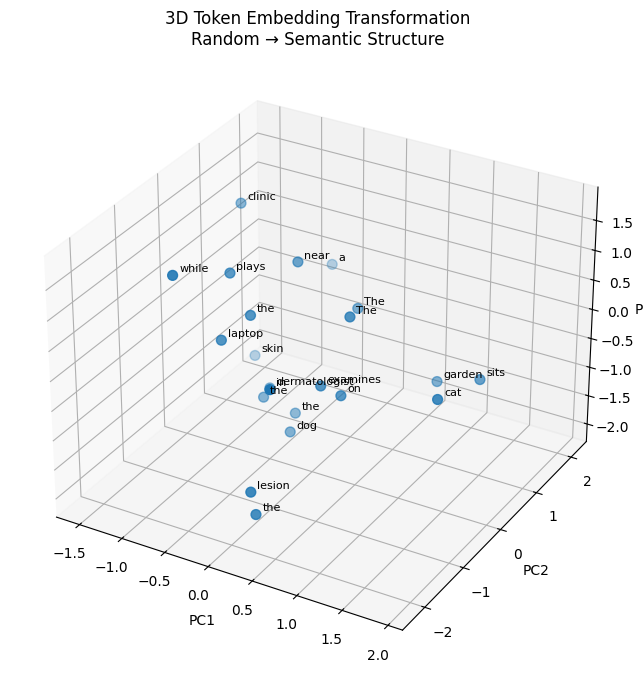

In [9]:
# If needed:
# !pip install -q sentence-transformers scikit-learn matplotlib pandas nltk

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

# -------------------------------------------------------
# 1. TEXT → TOKENS (words)
# -------------------------------------------------------

text = """
The cat sits on the laptop while the dermatologist examines a skin lesion.
The dog plays in the garden near the clinic.
"""

tokens = [t for t in word_tokenize(text) if t.isalpha()]  # keep words only
print("Tokens:", tokens)

# -------------------------------------------------------
# 2. EMBEDDINGS FOR EACH WORD
# -------------------------------------------------------
model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = model.encode(tokens, normalize_embeddings=True)

# -------------------------------------------------------
# 3. Reduce to 3D
# -------------------------------------------------------
pca = PCA(n_components=3)
emb_3d = pca.fit_transform(embeddings)

# -------------------------------------------------------
# 4. Random initial positions
# -------------------------------------------------------
np.random.seed(42)
init_positions = np.random.randn(*emb_3d.shape)

# -------------------------------------------------------
# 5. Setup 3D animation
# -------------------------------------------------------
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")

# All tokens are words → label is exactly the word
colors = ["tab:blue"] * len(tokens)  # one color for all words

scat = ax.scatter(init_positions[:, 0],
                  init_positions[:, 1],
                  init_positions[:, 2],
                  c=colors, s=50)

# Text labels for each token
texts = []
for i, tok in enumerate(tokens):
    t = ax.text(init_positions[i, 0] + 0.05,
                init_positions[i, 1] + 0.05,
                init_positions[i, 2] + 0.05,
                tok, fontsize=8)
    texts.append(t)

# Set axis limits
all_x = np.concatenate([init_positions[:, 0], emb_3d[:, 0]])
all_y = np.concatenate([init_positions[:, 1], emb_3d[:, 1]])
all_z = np.concatenate([init_positions[:, 2], emb_3d[:, 2]])

margin = 0.5
ax.set_xlim(all_x.min() - margin, all_x.max() + margin)
ax.set_ylim(all_y.min() - margin, all_y.max() + margin)
ax.set_zlim(all_z.min() - margin, all_z.max() + margin)

ax.set_title("3D Token Embedding Transformation\nRandom → Semantic Structure")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

# -------------------------------------------------------
# 6. Animation function
# -------------------------------------------------------

frames = 60

def update(frame):
    alpha = frame / (frames - 1)
    current_positions = (1 - alpha) * init_positions + alpha * emb_3d
    
    scat._offsets3d = (current_positions[:, 0],
                       current_positions[:, 1],
                       current_positions[:, 2])
    
    for i, t in enumerate(texts):
        t.set_position((current_positions[i, 0] + 0.05,
                        current_positions[i, 1] + 0.05))
        t.set_3d_properties(current_positions[i, 2] + 0.05)
    
    ax.set_title(f"Token Embeddings (frame {frame+1}/{frames})")
    return scat, *texts

anim = FuncAnimation(fig, update, frames=frames, interval=100, blit=False)

plt.show()

In [10]:
from IPython.display import HTML
HTML(anim.to_jshtml())

In [11]:
anim.save("embeddings_3d_animation.mp4", writer="ffmpeg", dpi=150)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
